### Extracting and Preparing Track Data from SQLite Database

In [1]:
#Got a bunch of data from link in report
import sqlite3
import time
import numpy as np
import pandas as pd
import json
import heapq
import matplotlib
import matplotlib.pyplot as plt
from collections import Counter

import sys
sys.path.append('A:\\UNI\\EXCHANGE_SEMS\\SEM2\\ML_application\\group_project\\ML-application-group\\util')
from util.vis import displayPopularArtists, displayMostCommonKeyWord
from util.dataIn import load_data


In [5]:
# This is the raw data we got
source_db_path = 'data/backup.db.sqlite3'
# This is a new file we are going to use
new_db_path = 'data/tracks2.db.sqlite3'

source_conn = sqlite3.connect(source_db_path)
source_cursor = source_conn.cursor()

# It is a very big database so we filtered it by just taking the values we are going to use
source_cursor.execute("""
SELECT
    MIN(t.id) AS id,
    t.name,
    l.plain_lyrics,
    a.name AS album_name,
    ar.name AS artist_name,
    t.spotify_id
FROM tracks AS t
INNER JOIN lyrics AS l ON l.track_id = t.id AND l.plain_lyrics IS NOT NULL
INNER JOIN albums AS a ON a.id = t.album_id
INNER JOIN artists AS ar ON ar.id = t.artist_id
WHERE t.lang = 'en' AND t.verified = 1 AND t.spotify_id != ''
GROUP BY t.spotify_id
ORDER BY id;
""")

data = source_cursor.fetchall()

source_conn.close()


### Creating a Retry Mechanism for Database Insertions

In [6]:
# As the previous query is not very efficient we saved it as a new database removing duplicates and unnecessary data
new_conn = sqlite3.connect(new_db_path)
new_cursor = new_conn.cursor()

new_cursor.execute("""
CREATE TABLE IF NOT EXISTS track_data (
    id INTEGER PRIMARY KEY,
    name TEXT,
    plain_lyrics TEXT,
    album_name TEXT,
    artist_name TEXT,
    spotify_id TEXT
);
""")

retry_limit = 3
for attempt in range(retry_limit):
    try:
        new_cursor.executemany("""
        INSERT INTO track_data (id, name, plain_lyrics, album_name, artist_name, spotify_id)
        VALUES (?, ?, ?, ?, ?, ?);
        """, data)
        break
    except sqlite3.OperationalError as e:
        if str(e) == 'database is locked':
            print("Attempt", attempt+1, "failed: Database is locked. Retrying...")
            time.sleep(1)  # wait for 1 second before retrying
        else:
            raise e
    else:
        continue
else:
    print("Failed to execute query after", retry_limit, "attempts due to database lock.")

new_conn.commit()
new_conn.close()

print("Data has been transferred and new database has been created.")

Data has been transferred and new database has been created.


### Reading Track Data from the New SQLite Database

In [7]:
# Now we get all the data from the new file
db_path = 'data/tracks2.db.sqlite3'

conn = sqlite3.connect(db_path)
cursor = conn.cursor()

cursor.execute("""
SELECT * from track_data
""")

# We save the spotify ids to check if it is present in the playlists
spotify_ids = {row[-1] for row in cursor.fetchall()}

conn.close()
# get all the id from the tracks in the playlist data

### Analyzing Spotify Playlist Data

In [8]:
# Change to the path you have
json_file_path = "A:\\UNI\\EXCHANGE_SEMS\\SEM2\\ML_application\\group_project\\ML-application-group\\data\\mpd.slice.0-999.json"

data = load_data(json_file_path)

track_counter = Counter()

# We wanted to check if the tracks we have will be common within the playlists for the recomendation system we wanted to make
for playlist in data['playlists']:
    track_uris = [track['track_uri'] for track in playlist['tracks']]
    track_counter.update(track_uris)

repeated_tracks_count = sum(1 for count in track_counter.values() if count > 1)

print(f"Number of unique songs repeated across different playlists: {repeated_tracks_count}")

Number of unique songs repeated across different playlists: 9635


### Filtering Spotify Playlists Based on Track IDs 

In [11]:
# From the two first jsons we have with playlists we want to filter them with just the songs we have in the other database
# In case we want more data we can add more files here
file_paths = [
    "A:\\UNI\\EXCHANGE_SEMS\\SEM2\\ML_application\\group_project\\ML-application-group\\data\\mpd.slice.0-999.json",
    "A:\\UNI\\EXCHANGE_SEMS\\SEM2\\ML_application\\group_project\\ML-application-group\\data\\mpd.slice.1000-1999.json"
]


all_playlists = []
for path in file_paths:
    data = load_data(path)
    all_playlists.extend(data['playlists'])

# Function to filter tracks in each playlist based on spotify_ids and remove empty playlists
def filter_tracks(playlists, spotify_ids):
    filtered_playlists = []
    for playlist in playlists:
        # Retain only tracks with URIs in spotify_ids
        filtered_tracks = [track for track in playlist['tracks'] if track['track_uri'].split(':')[-1] in spotify_ids]
        if filtered_tracks:  # Check if there are any tracks left
            playlist['tracks'] = filtered_tracks
            filtered_playlists.append(playlist)
    return filtered_playlists


filtered_playlists = filter_tracks(all_playlists, spotify_ids)
filtered_playlists

# filter track data that is in the playlist and both track data

[{'name': 'Throwbacks',
  'collaborative': 'false',
  'pid': 0,
  'modified_at': 1493424000,
  'num_tracks': 52,
  'num_albums': 47,
  'num_followers': 1,
  'tracks': [{'pos': 0,
    'artist_name': 'Missy Elliott',
    'track_uri': 'spotify:track:0UaMYEvWZi0ZqiDOoHU3YI',
    'artist_uri': 'spotify:artist:2wIVse2owClT7go1WT98tk',
    'track_name': 'Lose Control (feat. Ciara & Fat Man Scoop)',
    'album_uri': 'spotify:album:6vV5UrXcfyQD1wu4Qo2I9K',
    'duration_ms': 226863,
    'album_name': 'The Cookbook'},
   {'pos': 1,
    'artist_name': 'Britney Spears',
    'track_uri': 'spotify:track:6I9VzXrHxO9rA9A5euc8Ak',
    'artist_uri': 'spotify:artist:26dSoYclwsYLMAKD3tpOr4',
    'track_name': 'Toxic',
    'album_uri': 'spotify:album:0z7pVBGOD7HCIB7S8eLkLI',
    'duration_ms': 198800,
    'album_name': 'In The Zone'},
   {'pos': 3,
    'artist_name': 'Justin Timberlake',
    'track_uri': 'spotify:track:1AWQoqb9bSvzTjaLralEkT',
    'artist_uri': 'spotify:artist:31TPClRtHm23RisEBtV3X7',
    

In [12]:
# Save this new filtered data in a new json that is the one we are going to use
output_file_path = "A:\\UNI\\EXCHANGE_SEMS\\SEM2\\ML_application\\group_project\\ML-application-group\\data\\filtered_playlists.json"
with open(output_file_path, 'w') as outfile:
    json.dump(filtered_playlists, outfile, indent=4)

print("Filtered playlists have been written to:", output_file_path)


Filtered playlists have been written to: A:\UNI\EXCHANGE_SEMS\SEM2\ML_application\group_project\ML-application-group\data\filtered_playlists.json


In [2]:
# Again check that the songs appear in several in several playlists
json_file_path = "A:\\UNI\\EXCHANGE_SEMS\\SEM2\\ML_application\\group_project\\ML-application-group\\data\\filtered_playlists.json"


filtered_playlists = load_data(json_file_path)

track_counter = Counter()

for playlist in filtered_playlists:
    track_uris = [track['track_uri'] for track in playlist['tracks']]
    track_counter.update(track_uris)

for track_uri, count in track_counter.items():
    print(f"Track URI: {track_uri} is repeated {count} times")

repeated_tracks_count = sum(1 for count in track_counter.values() if count > 1)
print(f"Number of unique songs repeated across different playlists: {repeated_tracks_count}")

unique_tracks_count = len(track_counter)
print(f"Number of unique tracks in the filtered playlists: {unique_tracks_count}")

Track URI: spotify:track:0UaMYEvWZi0ZqiDOoHU3YI is repeated 14 times
Track URI: spotify:track:6I9VzXrHxO9rA9A5euc8Ak is repeated 22 times
Track URI: spotify:track:1AWQoqb9bSvzTjaLralEkT is repeated 19 times
Track URI: spotify:track:3BxWKCI06eQ5Od8TY2JBeA is repeated 13 times
Track URI: spotify:track:7H6ev70Weq6DdpZyyTmUXk is repeated 24 times
Track URI: spotify:track:2PpruBYCo4H7WOBJ7Q2EwM is repeated 44 times
Track URI: spotify:track:4Y45aqo9QMa57rDsAJv40A is repeated 3 times
Track URI: spotify:track:215JYyyUnrJ98NK3KEwu6d is repeated 5 times
Track URI: spotify:track:19Js5ypV6JKn4DMExHQbGc is repeated 6 times
Track URI: spotify:track:7DFnq8FYhHMCylykf6ZCxA is repeated 10 times
Track URI: spotify:track:67T6l4q3zVjC5nZZPXByU8 is repeated 23 times
Track URI: spotify:track:5Q0Nhxo0l2bP3pNjpGJwV1 is repeated 47 times
Track URI: spotify:track:69ghzc538EQSVon2Gm3wrr is repeated 6 times
Track URI: spotify:track:12qZHAeOyTf93YAWvGDTat is repeated 37 times
Track URI: spotify:track:1X5WGCrUMuwRF

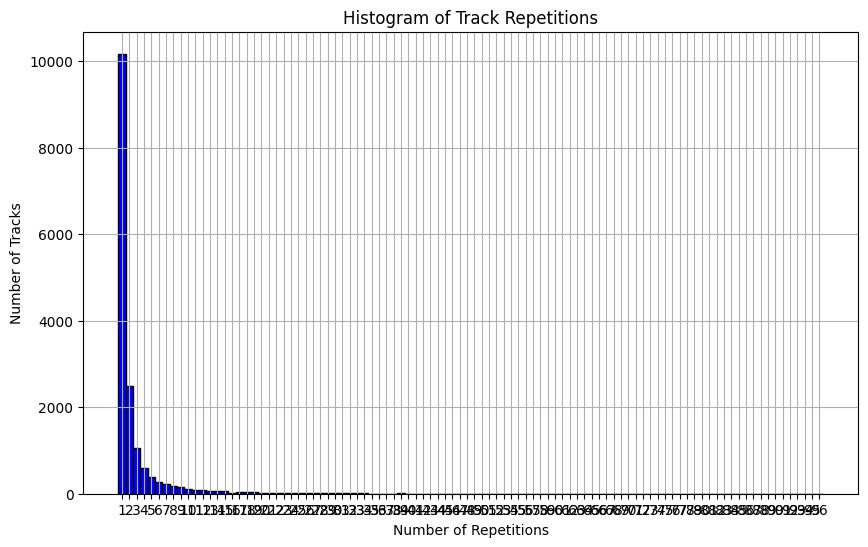

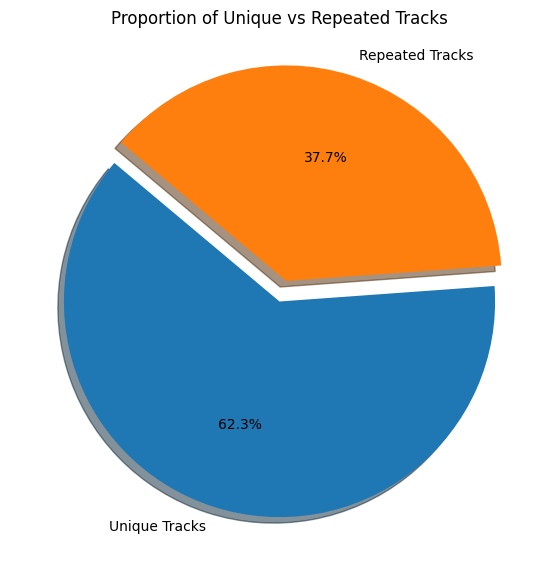

In [14]:
# Histogram of track repetitions
repetition_counts = list(track_counter.values())
plt.figure(figsize=(10, 6))
plt.hist(repetition_counts, bins=range(1, max(repetition_counts)+2), align='left', color='blue', edgecolor='black')
plt.title('Histogram of Track Repetitions')
plt.xlabel('Number of Repetitions')
plt.ylabel('Number of Tracks')
plt.xticks(range(1, max(repetition_counts)+1))
plt.grid(True)
plt.show()

# Pie chart to show unique vs repeated tracks
unique_tracks = sum(1 for count in track_counter.values() if count == 1)
repeated_tracks = unique_tracks_count - unique_tracks
labels = 'Unique Tracks', 'Repeated Tracks'
sizes = [unique_tracks, repeated_tracks]
explode = (0, 0.1)  # only "explode" the 2nd slice

plt.figure(figsize=(7, 7))
plt.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Proportion of Unique vs Repeated Tracks')
plt.show()


## merging data between SQL (track_Data) and Playlist data(filtered_Data)

In [3]:
# Connect to the SQLite database
conn = sqlite3.connect('data/tracks2.db.sqlite3')
query = "SELECT spotify_id, plain_lyrics FROM track_data"
lyrics_dict = pd.read_sql(query, conn, index_col='spotify_id').to_dict()['plain_lyrics']
conn.close()

tracks_list = []

# Extract tracks data and enrich with lyrics
for playlist in filtered_playlists:
    for track in playlist['tracks']:
        spotify_id = track['track_uri'].split(':')[-1]  # Extract Spotify ID from the URI
        track_info = {
            "Playlist Name": playlist.get('name', 'No Name'),
            "Playlist ID":playlist.get('pid','No id'),
            "Track Name": track['track_name'],
            "Track URI": track['track_uri'],
            "Artist Name": track.get('artist_name', 'Unknown'),
            "Lyrics": lyrics_dict.get(spotify_id, 'No Lyrics Found')  # Enrich with lyrics if available
        }
        tracks_list.append(track_info)

# Create a DataFrame
df_tracks = pd.DataFrame(tracks_list)
print(df_tracks.head())  # This will print the first few rows of the DataFrame

# Save the DataFrame to a pickle file for easy reloading
df_tracks.to_pickle('data\\final_data.pkl')
print("succesfully stored")


  Playlist Name  Playlist ID                                  Track Name  \
0    Throwbacks            0  Lose Control (feat. Ciara & Fat Man Scoop)   
1    Throwbacks            0                                       Toxic   
2    Throwbacks            0                              Rock Your Body   
3    Throwbacks            0                                     Buttons   
4    Throwbacks            0                                 Say My Name   

                              Track URI         Artist Name  \
0  spotify:track:0UaMYEvWZi0ZqiDOoHU3YI       Missy Elliott   
1  spotify:track:6I9VzXrHxO9rA9A5euc8Ak      Britney Spears   
2  spotify:track:1AWQoqb9bSvzTjaLralEkT   Justin Timberlake   
3  spotify:track:3BxWKCI06eQ5Od8TY2JBeA  The Pussycat Dolls   
4  spotify:track:7H6ev70Weq6DdpZyyTmUXk     Destiny's Child   

                                              Lyrics  
0  Music make you lose control\nMusic make you lo...  
1  Baby, can't you see I'm calling?\nA guy like y...  

just tried to check the data "filtered data", however, it seems like the number of tracks differs by playlist

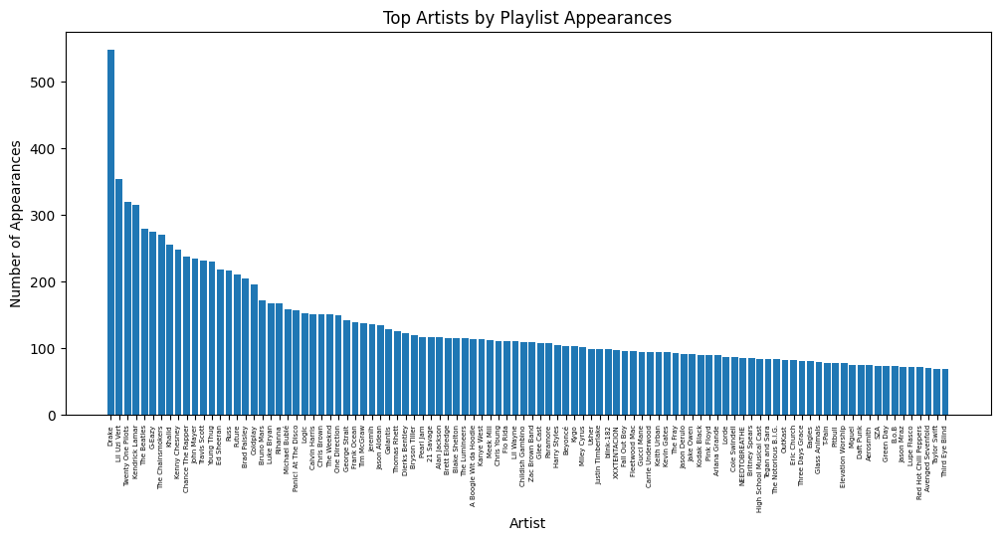

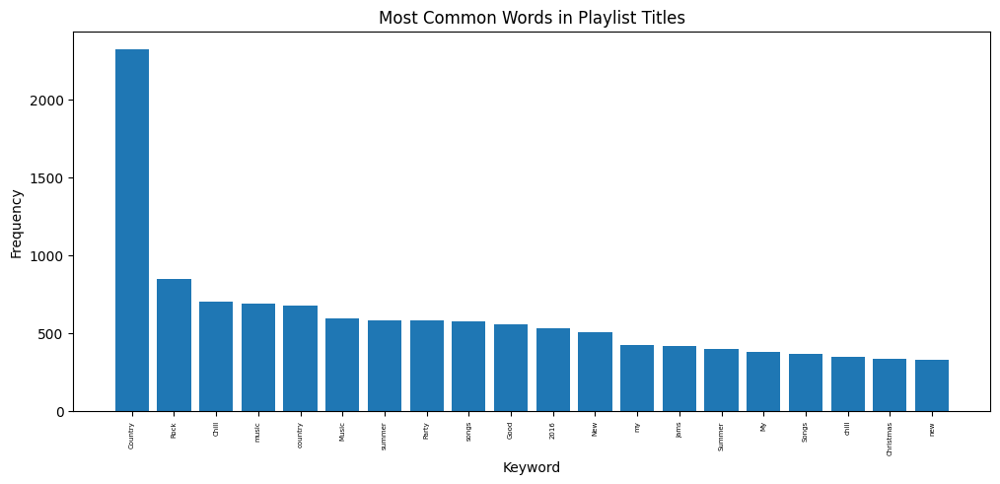

In [8]:
import traceback

try:
    displayPopularArtists(df_tracks, lim=100)
    displayMostCommonKeyWord(df_tracks)
except Exception as e:
    print(f"An error occurred: {e}")
    traceback.print_exc()  # This will print the full traceback


         Playlist Name  Track Count
0           Throwbacks           17
1     Awesome Playlist           10
2                  mat           43
3                  90s            7
4              Wedding           28
...                ...          ...
1904               woo           51
1905        NEW YEARS            13
1906             JESUS           20
1907               yep            9
1908        Sad Music            10

[1909 rows x 2 columns]
Mean number of tracks per playlist: 22.80
Standard deviation of tracks per playlist: 20.50


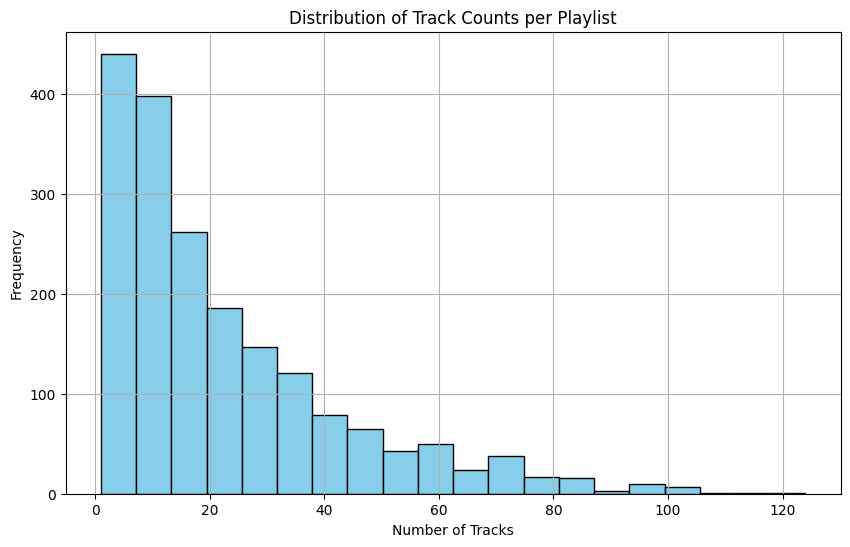

In [19]:
playlist_data = []
for playlist in filtered_playlists:
    playlist_name = playlist.get('name', 'Unnamed Playlist')
    track_count = len(playlist['tracks']) if 'tracks' in playlist else 0
    playlist_data.append({
        "Playlist Name": playlist_name,
        "Track Count": track_count
    })

# Convert list to DataFrame
df = pd.DataFrame(playlist_data)
print(df)

mean_tracks = df['Track Count'].mean()
std_dev_tracks = df['Track Count'].std()

print(f"Mean number of tracks per playlist: {mean_tracks:.2f}")
print(f"Standard deviation of tracks per playlist: {std_dev_tracks:.2f}")


# Sorting data for better visualization
sorted_df = df.sort_values('Track Count', ascending=False)

# Histogram of track counts
plt.figure(figsize=(10, 6))
plt.hist(df['Track Count'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Track Counts per Playlist')
plt.xlabel('Number of Tracks')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

## Making Popularity matrix (binary)